# An Algorithm for Peer Reviewer Recommendation Algorithm
An algorithm that recommends suitable peer reviewers for reviewing submitted manuscripts based on the assessment of scholarly activities. The assessment of reviewer candidates' scholarly activities is conducted based on the expertise in the field being researched, coauthor or coworker relationship with the author of the manuscript, and participation in reviewing.

In [1]:
from IPython.display import Image
from src import peer_reviewer_recommendation

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/share/rc


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


## The Workflow of Peer Reviewer Recommendation Algorithm
The following workflow shows the workflow among Peer-Reviewer-Recommendation algorithm, journal management, and peer review contract management.

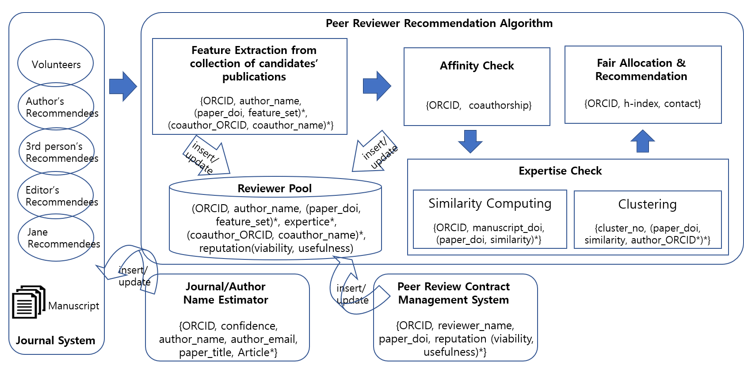

In [ ]:
Image("./png/nomal.png", width=750, height=450)

---
## Submission of Manuscript
The algorithm receives input data from the submitted manuscript, and then proceeds the algorithm for reviewer recommendation.

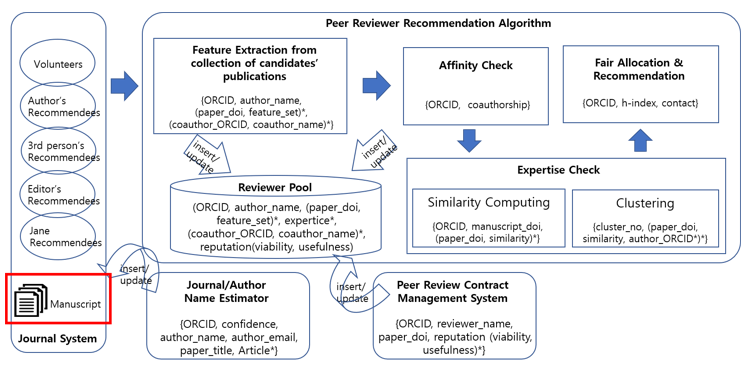

In [ ]:
Image("./png/manu.png", width=750, height=450)

In [2]:
manuscript={
  "date":20230101,
  "submitter_orcid":'0000-0003-0460-7013',
  "submitter_name":'Lu Qin',
  "submitter_institution":'The Chinese University of Hong Kong, Hong Kong, China',
  "submitter_email":'lqin@se.cuhk.edu.hk',
  "submitter_title_doi":'-',
  "submitter_title":'Diversifying Top-K Results',
  "submitter_intro":'''ABSTRACT This paper proposes a general framework for matching similar subsequences in both time series and string databases. The matching results are pairs of query subsequences and database subsequences. The framework finds all possible pairs of similar subsequences if the distance measure satis- fies the "consistency" property, which is a property intro- duced in this paper. We show that most popular distance functions, such as the Euclidean distance, DTW, ERP, the Freche?t distance for time series, and the Hamming distance and Levenshtein distance for strings, are all "consistent". We also propose a generic index structure for metric spaces named "reference net". The reference net occupies O(n) space, where n is the size of the dataset and is optimized to work well with our framework. The experiments demon- strate the ability of our method to improve retrieval perfor- mance when combined with diverse distance measures. The experiments also illustrate that the reference net scales well in terms of space overhead and query time. 1. INTRODUCTION Sequence databases are used in many real-world applica- tions to store diverse types of information, such as DNA and protein data, wireless sensor observations, music and video streams, and financial data. Similarity-based search in such databases is an important functionality, that allows identi- fying, within large amounts of data, the few sequences that contain useful information for a specific task at hand. For example, identifying the most similar database matches for a query sequence can be useful for classification, forecasting, or retrieval of similar past events. The most straightforward way to compare the similarity between two sequences is to use a global similarity mea- sure, that computes an alignment matching the entire first sequence to the entire second sequence. However, in many scenarios it is desirable to perform subsequence matching, where, given two sequences Q and X, we want to identify pairs of subsequences SQ of Q and SX of X, such that the similarity between SQ and SX is high. When a large database of sequences is available, it is important to be able to identify, given a query Q, an optimally matching pair SQ and SX, where SX can be a subsequence of any database sequence. A well-known example of the need for subsequence match- ing is in comparisons of biological sequences. It is quite possible that two DNA sequences Q and X have a large Levenshtein distance [22] (also known as edit distance) be- tween them (e.g., a distance equal to 90% of the length of the sequences), while nonetheless containing subsequences SQ and SX that match at a very high level of statistical significance. Identifying these optimally matching subse- quences [34] helps biologists reason about the evolutionary relationship between Q and X, and possible similarities of functionality between those two pieces of genetic code. Similarly, subsequence matching can be useful in searching music databases, video databases, or databases of events and activities represented as time series. In all the above cases, while the entire query sequence may not have a good match in the database, there can be highly informative and statistically significant matches between subsequences of the query and subsequences of database sequences. Several methods have been proposed for efficient subse- quence matching in large sequence databases. However, all the proposed techniques are targeted to specific distance or similarity functions, and it is not clear how and when these techniques can be generalized and applied to other dis- tances. Especially, subsequence retrieval methods for string databases are difficult to be used for time-series databases. Furthermore, when a new distance function is proposed, we need to develop new techniques for efficient subsequence matching. In this paper we present a general framework, which can be applied to any arbitrary distance metric, as long as the metric satisfies a specific property that we call "consistency". Furthermore, we show that many well-known existing distance functions satisfy consistency. Thus, our framework can deal with both sequence types, i.e., strings and time series, including cases where each element of the sequence is a complex object. The framework in this paper consists of a number of steps: dataset segmentation, query segmentation, range query, can- didate generation, and subsequence retrieval. Brute-force search would require evaluating a total of O (|Q|2 |X|2) pairs of subsequences of Q and X. However our filtering method produces a shortlist of candidates after considering O (|Q| |X|) pairs of segments only. For the case where the distance is a metric, we also present a hierarchical reference 1579 Permission to make digital or hard copies of all or part of this work for personal or classroom use is granted without fee provided that copies are not made or distributed for profit or commercial advantage and that copies bear this notice and the full citation on the first page. To copy otherwise, to republish, to post on servers or to redistribute to lists, requires prior specific permission and/or a fee. Articles from this volume were invited to present their results at The 38th International Conference on Very Large Data Bases, August 27th - 31st 2012, Istanbul, Turkey. Proceedings of the VLDB Endowment, Vol. 5, No. 11 Copyright 2012 VLDB Endowment 2150-8097/12/07... $ 10.00. net, a novel generic index structure that can be used within our framework to provide efficient query processing. Overall, this paper makes the following contributions: ? We propose a framework that, compared to alterna- tive methods, makes minimal assumptions about the underlying distance, and thus can be applied to a large variety of distance functions. ? We introduce the notion of Ã¢Â\x9cconsistencyÃ¢Â\x9d as an im- portant property for distance measures applied to se- quences. ? We propose an efficient filtering method, which pro- duces a shortlist of candidates by matching only O(|Q| |X|) pairs of subsequences, whereas brute force would match O (|Q|2 |X|2) pairs of subsequences. ? We make this filtering method even faster, by using a generic indexing structure with linear space based on reference nets, that efficiently supports range similar- ity queries. ? Experiments demonstrate the ability of our method to provide good performance when combined with diverse metrics such as the Levenshtein distance for strings, and ERP [8] and the discrete Freche?t distance [11]) for time series. 2. RELATEDWORK Typically, the term "sequences" can refer to two different data types: strings and time-series. There has been a lot of work in subsequence retrieval for both time series and string databases. However, in almost all cases, existing methods concentrate on a specific distance function or specific type of queries. Here we review some of the recent works on subse- quence matching. Notice that this review is not exhaustive since the topic has received a lot of attention and a complete survey is beyond the scope of this paper. Time-series databases and efficient similarity retrieval have received a lot of attention in the last two decades. The first method for subsequence similarity retrieval under the Eu- clidean (L2?norm) distance appeared in the seminal paper of Faloutsos et al. [12]. The main idea is to use a sliding win- dow to create smaller sequences of fixed length and then use a dimensionality reduction technique to map each window to a small number of features that are indexed using a spa- tial index (e.g., R?-tree). Improvements of this technique have appeared in [28, 27] that improve both the window- based index construction and the query time using sliding windows on the query and not on the database. However, all these techniques are ap''',
  "submitter_author1_name":'Lu Qin',
  "submitter_author1_institution":'The Chinese University of Hong Kong, Hong Kong, China',
  "submitter_author1_email":'lqin@se.cuhk.edu.hk',
  "submitter_author2_name":'Jeffrey Xu Yu',
  "submitter_author2_institution":'The Chinese University of Hong Kong, Hong Kong, China',
  "submitter_author2_email":'yu@se.cuhk.edu.hk',
  "submitter_author3_name":'Lijun Chang',
  "submitter_author3_institution":'The Chinese University of Hong Kong, Hong Kong, China',
  "submitter_author3_email":'ljchang@se.cuhk.edu.hk'}
submitted_manuscript = peer_reviewer_recommendation.peer_reviewer(manuscript)
submitted_manuscript.submitter_df

,date,submitter_orcid,submitter_name,submitter_institution,submitter_email,submitter_title_doi,submitter_title,submitter_intro,submitter_author1_name,submitter_author1_institution,...,submitter_author7_email,submitter_author8_name,submitter_author8_institution,submitter_author8_email,submitter_author9_name,submitter_author9_institution,submitter_author9_email,submitter_author10_name,submitter_author10_institution,submitter_author10_email
0,20230101,0000-0003-0460-7013,Lu Qin,"The Chinese University of Hong Kong, Hong Kong...",lqin@se.cuhk.edu.hk,-,Diversifying Top-K Results,ABSTRACT This paper proposes a general framewo...,Lu Qin,"The Chinese University of Hong Kong, Hong Kong...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


---
## Jounal/Author Name Estimator(JANE)
Receive reviewer recommendation from Jounal/Author Name Estimator(JANE) through HTTP request.

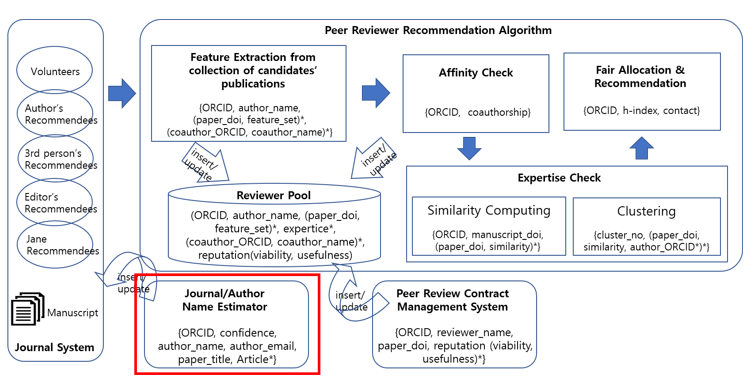

In [ ]:
Image("./png/jane.png", width=750, height=450)

### Get HTTP call from JANE

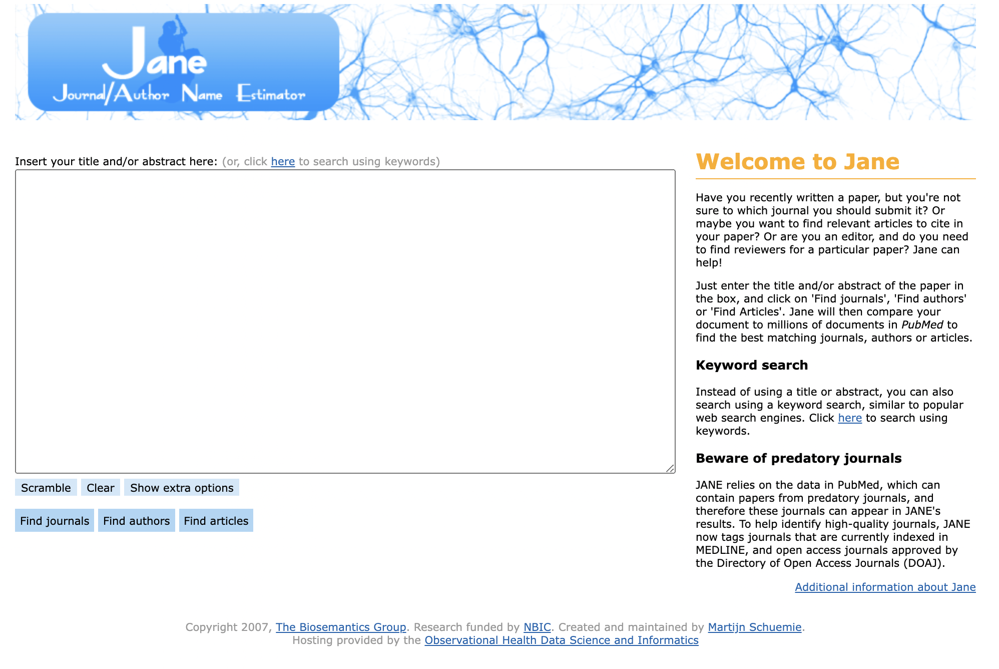

In [ ]:
Image("./png/jane_site.png", width=750, height=450)

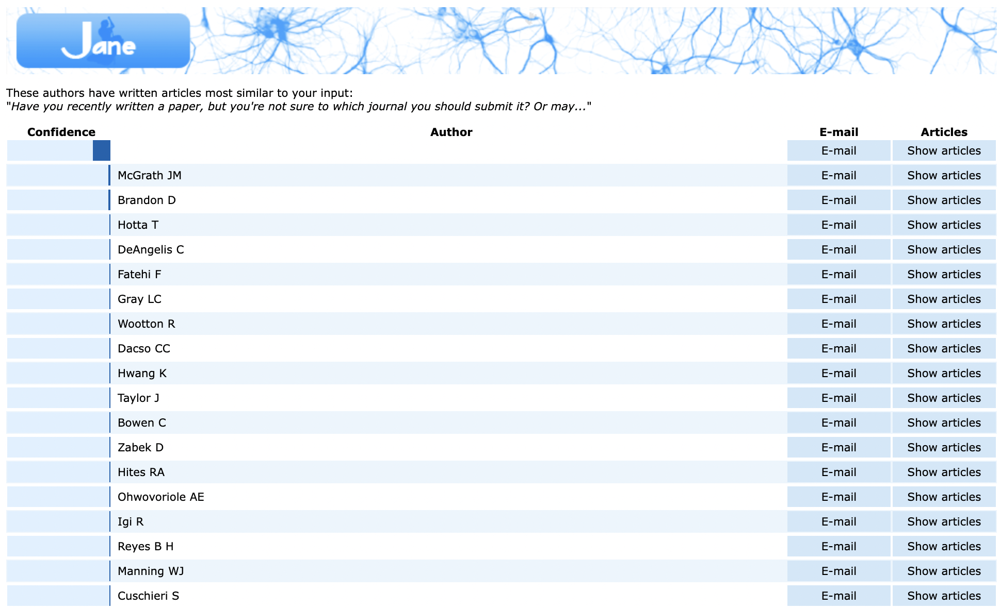

In [ ]:
Image("./png/jane_site2.png", width=750, height=450)

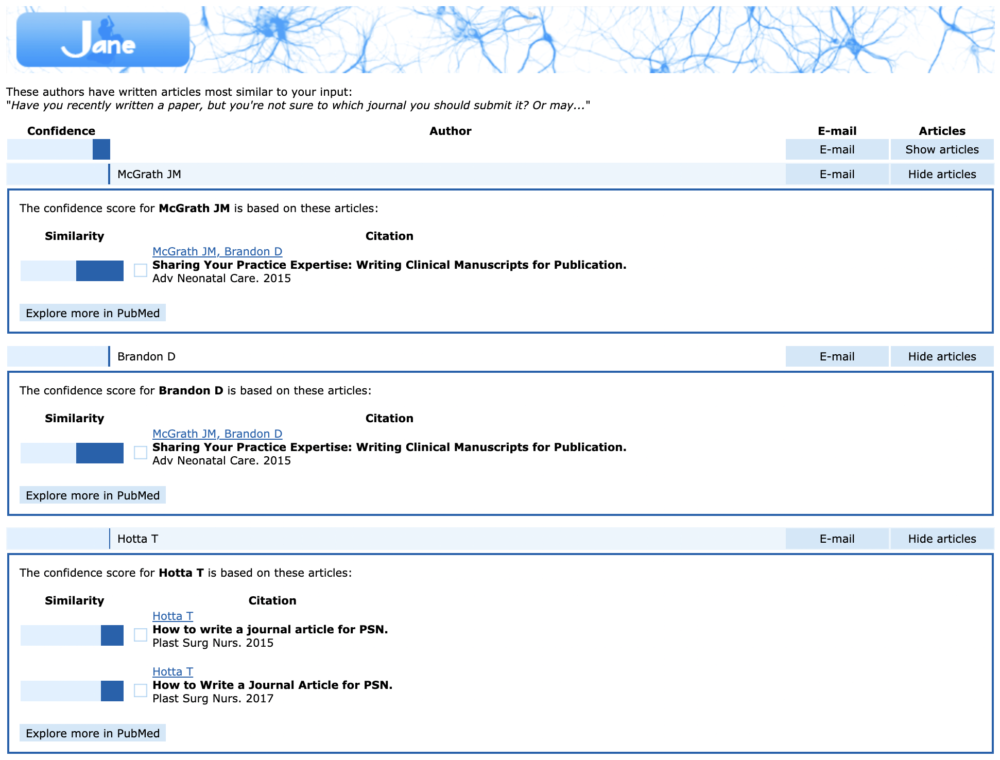

In [ ]:
Image("./png/jane_site3.png", width=750, height=450)

In [ ]:
Image("./png/jane_site4.png", width=900, height=450)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
Image("./png/jane_site5.png", width=750, height=450)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
Image("./png/jane_site6.png", width=900, height=450)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
jane_headers = {
    'Connection': 'keep-alive',
    'Cache-Control': 'max-age=0',
    'sec-ch-ua': '',
    'sec-ch-ua-mobile': '?0',
    'sec-ch-ua-platform': '',
    'Origin': 'https://jane.biosemantics.org',
    'Upgrade-Insecure-Requests': '1',
    'DNT': '1',
    'Content-Type': 'application/x-www-form-urlencoded',
    'User-Agent': '',
    'Accept': '',
    'Sec-Fetch-Site': 'same-origin',
    'Sec-Fetch-Mode': 'navigate',
    'Sec-Fetch-User': '?1',
    'Sec-Fetch-Dest': 'document',
    'Referer': 'https://jane.biosemantics.org/',
    'Accept-Language': 'ko-KR,ko;q=0.9,en-US;q=0.8,en;q=0.7',}

pubmed_headers = {
    'authority': 'pubmed.ncbi.nlm.nih.gov',
    'cache-control': 'max-age=0',
    'sec-ch-ua': '"Chromium";v="94", "Google Chrome";v="94", ";Not A Brand";v="99"',
    'sec-ch-ua-mobile': '?0',
    'sec-ch-ua-platform': '"macOS"',
    'dnt': '1',
    'upgrade-insecure-requests': '1',
    'user-agent': '',
    'accept': '',
    'sec-fetch-site': 'cross-site',
    'sec-fetch-mode': 'navigate',
    'sec-fetch-user': '?1',
    'sec-fetch-dest': 'document',
    'referer': 'https://jane.biosemantics.org/',
    'accept-language': 'ko-KR,ko;q=0.9,en-US;q=0.8,en;q=0.7',
    'cookie': '',}

submitted_manuscript.jane(jane_headers)
submitted_manuscript.pubmed(pubmed_headers)
print('- The Reviewers Recommended by JANE:\n',', '.join(submitted_manuscript.jane_submitter))

- The Reviewers Recommended by JANE:
 Wang J, Sahni S, Zhao C, Wang Y, Yu J, Gao Y, Kohno H, Waterman MS, Yu YW, Berger B


### Get HTTP call from ORCID

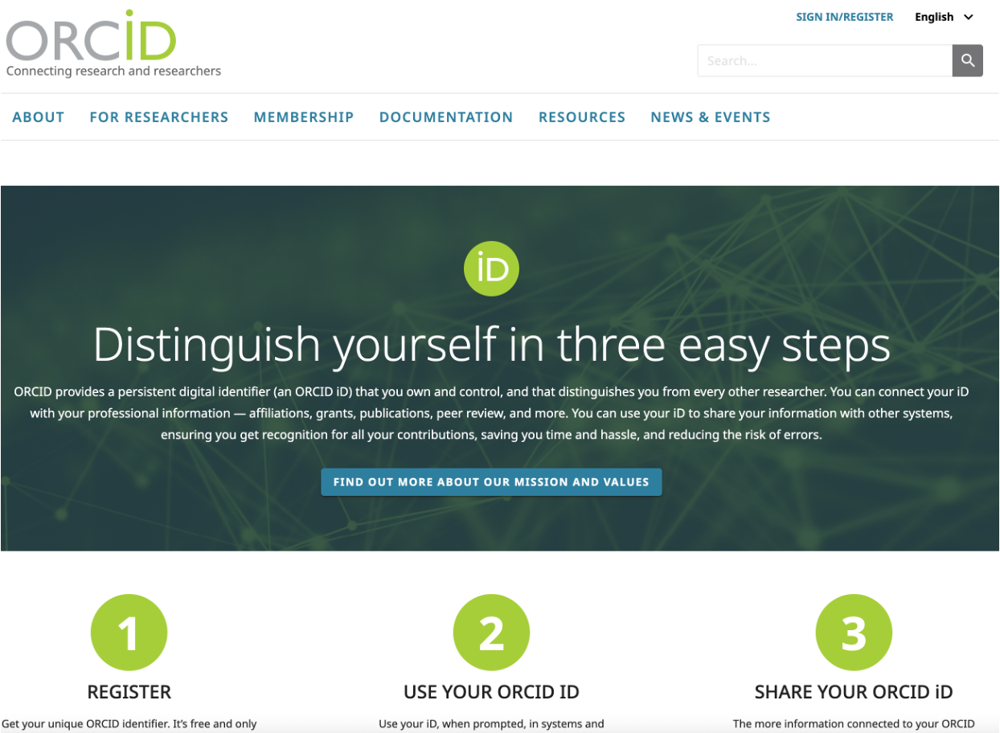

In [ ]:
Image("./png/orcid1.png", width=750, height=450)

In [ ]:
Image("./png/orcid2.png", width=900, height=450)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
orcid_headers = {
    'authority': 'pub.orcid.org',
    'sec-ch-ua': '"Chromium";v="94", "Google Chrome";v="94", ";Not A Brand";v="99"',
    'accept': 'application/json',
    'dnt': '1',
    'sec-ch-ua-mobile': '?0',
    'user-agent': '',
    'sec-ch-ua-platform': '"macOS"',
    'origin': 'https://orcid.org',
    'sec-fetch-site': 'same-site',
    'sec-fetch-mode': 'cors',
    'sec-fetch-dest': 'empty',
    'referer': 'https://orcid.org/',
    'accept-language': 'ko-KR,ko;q=0.9,en-US;q=0.8,en;q=0.7',}
submitted_manuscript.orcid(orcid_headers)

---

## Feature Extraction
The Feature set extraction is restricted to title, abstract, and introduction section of papers. This algorithm generate a word graph from submitted manuscripts, and extract high-ranking feature sets computed by the PageRank algorithm.

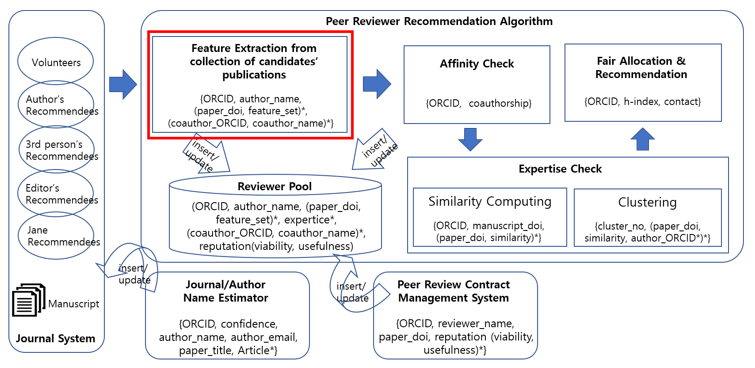

In [ ]:
Image("./png/extrac.png", width=750, height=450)

In [ ]:
submitted_manuscript.feature_set()
print('- One of the Reviewers Recommended by JANE: \n',submitted_manuscript.jane_submitter[0])
print('- One of the Reviewers\'s Feature-set Recommended by JANE: \n',submitted_manuscript.jane_submitter_abst[0])

- One of the Reviewers Recommended by JANE: 
 Wang J
- One of the Reviewers's Feature-set Recommended by JANE: 
 image retrieval metric similarity dataset method attention achieve comparable based learned slides spend lots kimia viewing recall


---

## Reviewer Pool
The data entered from Reviewer Pool are transformed to Pandas data format by 'Input Data Preparation'. Subsequently, reusable data, such as feature sets extracted from reviewer candidates published papers, are stored in Reviewer Pool at 'Output Data Preparation' step.

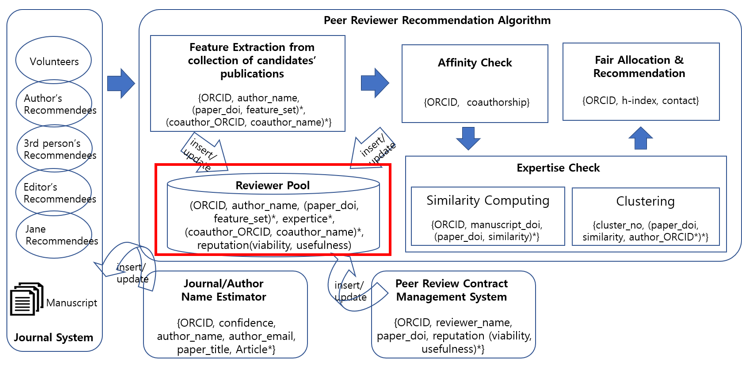

In [ ]:
Image("./png/pool.png", width=750, height=450)

In [ ]:
submitted_manuscript.reviewer_pool('./db/network.csv')
submitted_manuscript.network_csv.head(5)

,Aman Sinha,Anastasia Ailamaki,AnHai Doan,Beng Chin Ooi,Brit Youngmann,Chin-Wan Chung,Chong Sun,Christian S. Jensen,Christoph Koch,Gao Cong,...,Zsolt István,Zuhair Khayyat,Wang J,Sahni S,Zhao C,Wang Y,Gao Y,Waterman MS,Yu YW,Berger B
Aman Sinha,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Anastasia Ailamaki,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AnHai Doan,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Beng Chin Ooi,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Brit Youngmann,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


---

## Affinity Check
The Affinity check is done to find if there is any coauthor and/or coworker relationship among reviewer candidates and authors of submitter's manuscript. This ensures that reviewer candidates in conflict of interest are excluded.

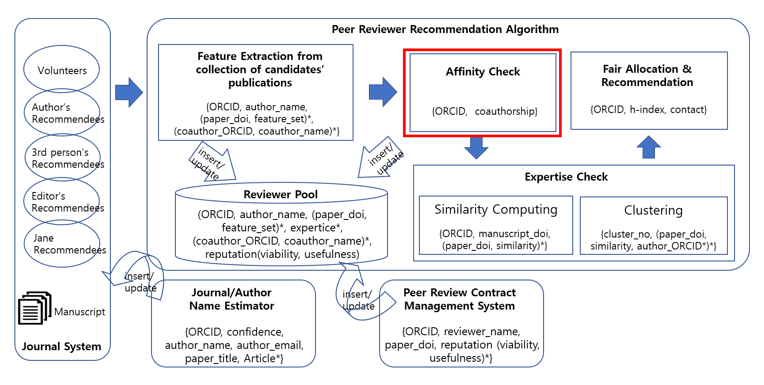

In [ ]:
Image("./png/affin.png", width=750, height=450)

In [ ]:
submitted_manuscript.affinity_check('./db/reviewer_information.csv', friends_of_friends=3)
print('- The Number of Reviewers with Affinity:', len(submitted_manuscript.affinity), 'reviewers')
print('- The Reviewers with Affinity:\n', ', '.join(submitted_manuscript.affinity[:5]))

- The Number of Reviewers with Affinity: 584 reviewers
- The Reviewers with Affinity:
 Cheng Long￠O, Raymond Chi-Wing Wong￠O H. V. Jagadish￠O, Xiaokui Xiao, Hui Hong, Calvin Young, Bradley Jewell


---

## Expertise Check
The Expertise check is based on Max Similarity calculation and agglomerative clustering by unsupervised agglomerative clustering. Expertise is identified from the results of Max Similarity and NJT algorithm.


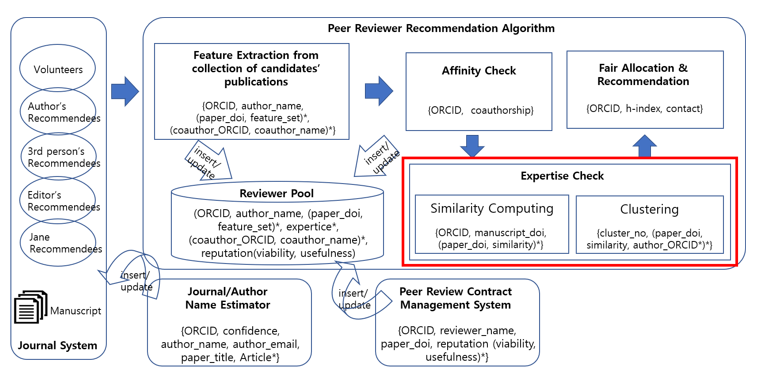

In [ ]:
Image("./png/exper.png", width=750, height=450)

In [ ]:
submitted_manuscript.expertise_check('./db/reviewer_coauthor.csv')
print('- The Number of Reviewers with Expertise: ',len(submitted_manuscript.expertise), 'reviewers')
print('- The Reviewers with Expertise: \n',', '.join(submitted_manuscript.expertise[:5]))

- The Number of Reviewers with Expertise:  14 reviewers
- The Reviewers with Expertise: 
 Jong Wook Kim , Qian Zhong, Yuhong Li, Robert Isele, Brian E. Ruttenberg


---
## Fair Allocation & Recommendation
To prevent any candidate from being fairly allocated, the limit of allocation is specified in advance. If a candidate is allocated to the limit, she/he is no longer recommended. Instead, re-ranked reviewer candidates are recommended as a reviewer. And also we are allocating a reviewer candidate according to $h$-index. This makes certain that the candidates are recommended fairly.

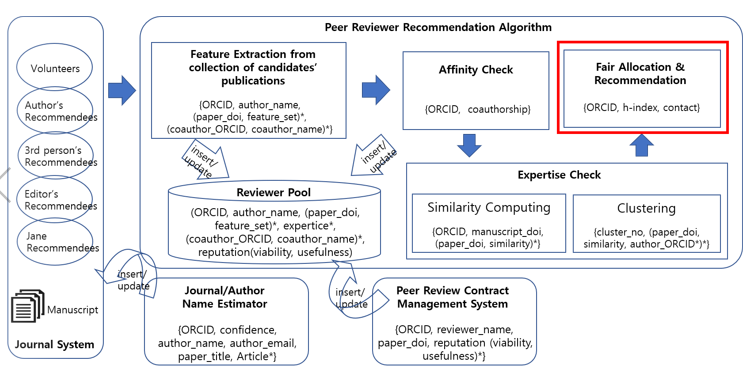

In [ ]:
Image("./png/fair.png", width=750, height=450)

In [ ]:
Image("./png/google0.png", width=750, height=500)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
Image("./png/google1.png", width=750, height=500)

Output hidden; open in https://colab.research.google.com to view.

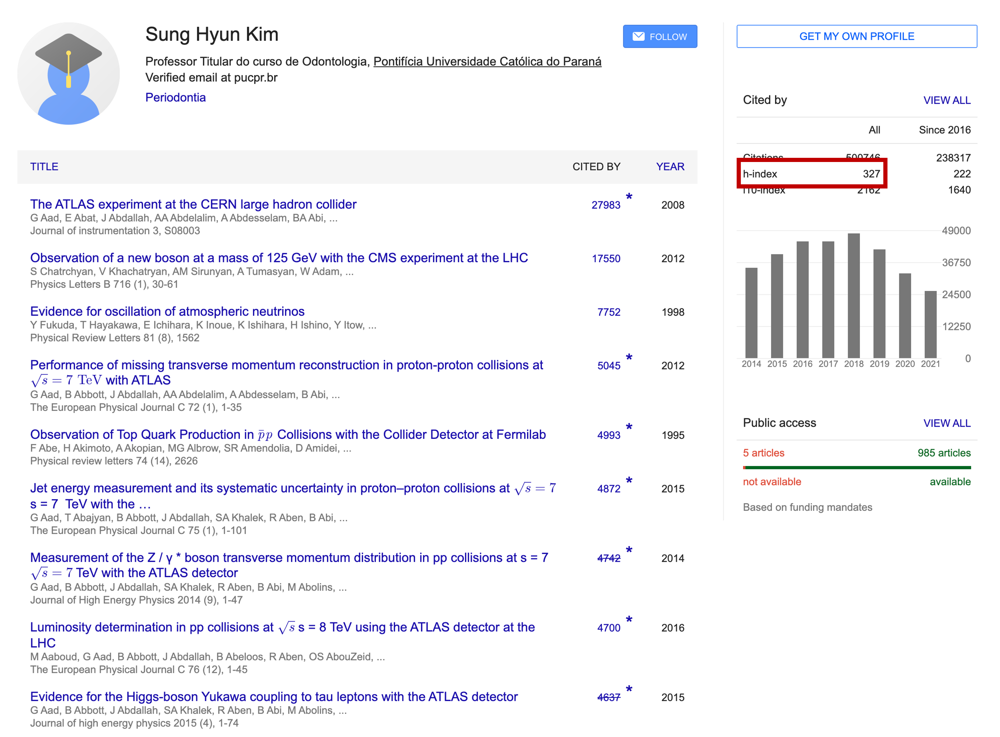

In [ ]:
Image("./png/google2.png", width=750, height=500)

In [ ]:
Image("./png/google3.png", width=900, height=500)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
scholar_google_headers = {
    'authority': 'scholar.google.com',
    'sec-ch-ua': '"Chromium";v="94", "Google Chrome";v="94", ";Not A Brand";v="99"',
    'sec-ch-ua-mobile': '?0',
    'sec-ch-ua-platform': '"macOS"',
    'upgrade-insecure-requests': '1',
    'dnt': '1',
    'user-agent': '',
    'accept': '',
    'x-client-data': '',
    'sec-fetch-site': 'same-origin',
    'sec-fetch-mode': 'navigate',
    'sec-fetch-user': '?1',
    'sec-fetch-dest': 'document',
    'referer': 'https://scholar.google.com/citations?hl=en&view_op=search_authors&mauthors=j+hyun&btnG=',
    'accept-language': 'ko-KR,ko;q=0.9,en-US;q=0.8,en;q=0.7',
    'cookie': '',}

h_index_headers = {
    'authority': 'scholar.google.com',
    'cache-control': 'max-age=0',
    'sec-ch-ua': '"Chromium";v="94", "Google Chrome";v="94", ";Not A Brand";v="99"',
    'sec-ch-ua-mobile': '?0',
    'sec-ch-ua-platform': '"macOS"',
    'dnt': '1',
    'upgrade-insecure-requests': '1',
    'user-agent': '',
    'accept': '',
    'x-client-data': '',
    'sec-fetch-site': 'none',
    'sec-fetch-mode': 'navigate',
    'sec-fetch-user': '?1',
    'sec-fetch-dest': 'document',
    'accept-language': 'ko-KR,ko;q=0.9,en-US;q=0.8,en;q=0.7',
    'cookie': '',}

submitted_manuscript.fair_allocation(scholar_google_headers, h_index_headers)
submitted_manuscript.fair_allocation_recommendation[:5]

,reviewer_orcid,reviewer_title,sim,reviewer_name,h_index
566,0000-0002-1343-5404,Skip-and-Prune: Cosine-based Top-K Query Proce...,0.190656,Jong Wook Kim,11
418,0000-0003-2151-1750,A Gauss Function Based Approach for Unbalanced...,0.157618,Qian Zhong,42
210,0000-0003-1684-207X,Quick-Motif: An Efficient and Scalable Framewo...,0.125128,Yuhong Li,10
333,0000-0003-2528-7557,TEDI: Efficient Shortest Path Query Answering ...,0.125128,Fang Wei,73
533,0000-0002-4074-1298,Publishing Microdata with a Robust Privacy Gua...,0.096720,Jianneng Cao,45


---